In [2]:
from ast import literal_eval

import plotly.express as px
import torch.nn.utils.parametrize as parametrize
from matrepr import mdisplay
from torch import linalg

from koopmann import aesthetics
from koopmann.data import (
    DatasetConfig,
    create_data_loader,
    get_dataset_class,
)
from koopmann.models import MLP, Autoencoder, ExponentialKoopmanAutencoder
from koopmann.models.utils import (
    pad_act,
    parse_safetensors_metadata,
)
from koopmann.utils import compute_model_accuracy
from koopmann.visualization import plot_eigenvalues

%load_ext autoreload
%autoreload 2

In [3]:
model_name = "mnist_model"
scale_idx = "0"
k = "1"
dim = "256"
user = "nsa325"

In [4]:
# Original model path
model_file_path = f"/home/{user}/work/koopmann/model_saves/{model_name}.safetensors"

# Autoenoder path in work dir
ae_file_path = f"/home/{user}/work/koopmann/model_saves/scaling/k_{k}_dim_{dim}_loc_{scale_idx}_autoencoder_{model_name}.safetensors"

# # Autoencoder path in scratch dir
# ae_file_path = (
#     f"/scratch/nsa325/koopmann/k_{k}_dim_{dim}_loc_{scale_idx}_autoencoder_{model_name}.safetensors"
# )

In [5]:
metadata = parse_safetensors_metadata(file_path=model_file_path)
dataset_config = DatasetConfig(
    dataset_name=metadata["dataset"],
    num_samples=5_000,
    split="test",
    seed=21,
)
DatasetClass = get_dataset_class(name=dataset_config.dataset_name)
dataset = DatasetClass(config=dataset_config)
dataloader = create_data_loader(dataset, batch_size=1024)

In [6]:
model, _ = MLP.load_model(model_file_path)
model.eval()
model.hook_model()
print(f"Original Model Testing Accuracy: {compute_model_accuracy(model.to('cpu'), dataset)}")

Original Model Testing Accuracy: 0.9757999777793884


In [7]:
autoencoder, metadata = Autoencoder.load_model(ae_file_path)
# autoencoder, metadata = ExponentialKoopmanAutencoder.load_model(ae_file_path)
autoencoder.eval()
k = literal_eval(metadata["num_scaled"])
print(f"Little K: {k}")

/home/nsa325/work/koopmann/koopmann/models/autoencoder.py:48: UserWarning: The latent dimension 256 should probably be larger than the input dimension 784!
  warnings.warn(


Little K: 1


K matrix with no power

In [8]:
px.imshow(autoencoder.koopman_matrix.linear_layer.weight.T.detach())

(<Figure size 400x400 with 1 Axes>,
 array([<Axes: title={'center': '$k=1$, $dim=256$'}>], dtype=object))

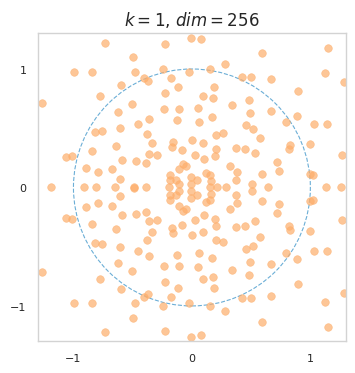

In [9]:
eigenvalues, eigenvectors = linalg.eig(autoencoder.koopman_matrix.linear_layer.weight.T.detach())
plot_eigenvalues(
    eigenvalues_dict={(k, dim): eigenvalues},
    tile_size=4,
)

K matrix powered

In [10]:
px.imshow(linalg.matrix_power(autoencoder.koopman_matrix.linear_layer.weight.T.detach(), k))

(<Figure size 400x400 with 1 Axes>,
 array([<Axes: title={'center': '$k=1$, $dim=256$'}>], dtype=object))

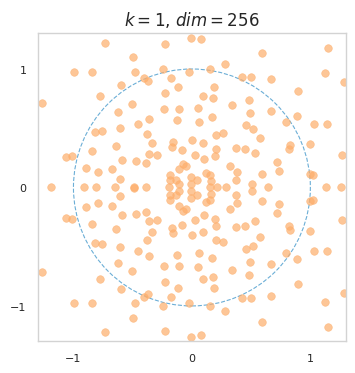

In [11]:
eigenvalues, eigenvectors = linalg.eig(
    linalg.matrix_power(autoencoder.koopman_matrix.linear_layer.weight.T.detach(), k)
)
plot_eigenvalues(
    eigenvalues_dict={(k, dim): eigenvalues},
    tile_size=4,
)


In [12]:
sample_idx = 1

In [13]:
batch = next(iter(dataloader))
images, labels = batch

First layer

In [14]:
model.forward(batch[0])
acts = model.get_fwd_activations()

In [15]:
recons = autoencoder(
    x=pad_act(acts[0], target_size=autoencoder.encoder[0].in_features), k=0
).reconstruction[:, : acts[0].size(-1)]
mdisplay(recons[0])
print((recons - acts[0]).pow(2).mean())

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,,123,124,125,126,127
0.1172,-0.0791,0.1875,1.3233,-0.0648,0.2079,0.3797,1.0756,0.0707,0.0523,-0.0247,0.0724,0.9319,-0.0536,-0.1345,0.5273,0.0910,0.0824,-0.1245,-0.0929,0.3135,0.0157,0.3766,0.0842,⋯,-0.1268,-0.0529,0.0362,0.0382,0.0035


tensor(0.0056, grad_fn=<MeanBackward0>)


Last layer

In [16]:
last_layer = 4

In [17]:
mdisplay(acts[last_layer][0])

0,1,2,3,4,5,6,7,8,9
-0.2667,-0.7776,-0.7962,-0.1839,-0.6295,6.3889,-1.2939,-0.4421,-1.2645,-1.0254


In [18]:
all_pred = autoencoder(x=batch[0].flatten(start_dim=1), k=k).predictions
pred = all_pred[-1, :, : acts[last_layer].size(-1)]
mdisplay(pred[0])
print((pred - acts[last_layer]).pow(2).mean())

0,1,2,3,4,5,6,7,8,9
-1.0884,-0.7228,-0.1712,-0.1374,1.6893,4.6038,-0.5168,-0.5616,-0.5135,-1.2167


tensor(0.4081, grad_fn=<MeanBackward0>)


In [19]:
recons = autoencoder(
    x=pad_act(acts[last_layer], target_size=autoencoder.encoder[0].in_features), k=0
).reconstruction[:, : acts[last_layer].size(-1)]
mdisplay(recons[0])
print((recons - acts[last_layer]).pow(2).mean())

0,1,2,3,4,5,6,7,8,9
-0.2193,-0.7388,-0.7915,-0.0810,-0.7253,6.3571,-1.4272,-0.4202,-1.1887,-1.0614


tensor(0.0349, grad_fn=<MeanBackward0>)
